# **Lab1. Шаврин Алексей Павлович гр. 1306**

# Установка зависимостей

In [ ]:
!pip install opencv-python-headless matplotlib

# Импорт

In [ ]:
import zipfile
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import os

# Загрузка данных

In [ ]:
with zipfile.ZipFile('Калибровка.zip', 'r') as zip_ref:
    zip_ref.extractall('calib_images')

In [ ]:
image_paths = glob.glob('calib_images/*.JPG')
image_paths.sort()
print(f"Найдено {len(image_paths)} изображений")

Найдено 22 изображений


# Параметры шахматной доски

In [ ]:
# Размер шахматной доски (число внутренних углов по горизонтали и вертикали)
chessboard_size = (14, 10)

# Размер квадрата в условных единицах
square_size = 1.0

# Подготовка объектных точек

In [ ]:
objp = np.zeros(
    (chessboard_size[0] * chessboard_size[1], 3),
    np.float32
)
objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2) * square_size

# Поиск углов на всех изображениях

In [ ]:
def draw_chessboard_snake(img, corners, pattern_size, thickness=2, point_radius=3, colormap=cv2.COLORMAP_RAINBOW):
    img_copy = img.copy()
    cols, rows = pattern_size
    pts = corners.reshape(-1, 2).astype(int)
    N = cols * rows

    # Генерируем цвета для каждой строки
    colors = []
    for i in range(rows):
        hue = (i * 180 // rows) % 180
        color_bgr = cv2.cvtColor(np.uint8([[[hue, 255, 255]]]), cv2.COLOR_HSV2BGR)[0,0].tolist()
        colors.append(tuple(color_bgr))

    # Рисуем точки
    for idx, pt in enumerate(pts):
        row = idx // cols
        cv2.circle(img_copy, tuple(pt), point_radius, colors[row], -1)

    # Горизонтальные линии внутри строк
    for row in range(rows):
        for col in range(cols - 1):
            idx1 = row * cols + col
            idx2 = row * cols + (col + 1)
            cv2.line(img_copy, tuple(pts[idx1]), tuple(pts[idx2]), colors[row], thickness)

    # Соединения между строками: конец текущей строки и начало следующей
    for row in range(rows - 1):
        last_idx = row * cols + (cols - 1)
        first_next_idx = (row + 1) * cols + 0
        cv2.line(img_copy, tuple(pts[last_idx]), tuple(pts[first_next_idx]), colors[row], thickness)

    return img_copy

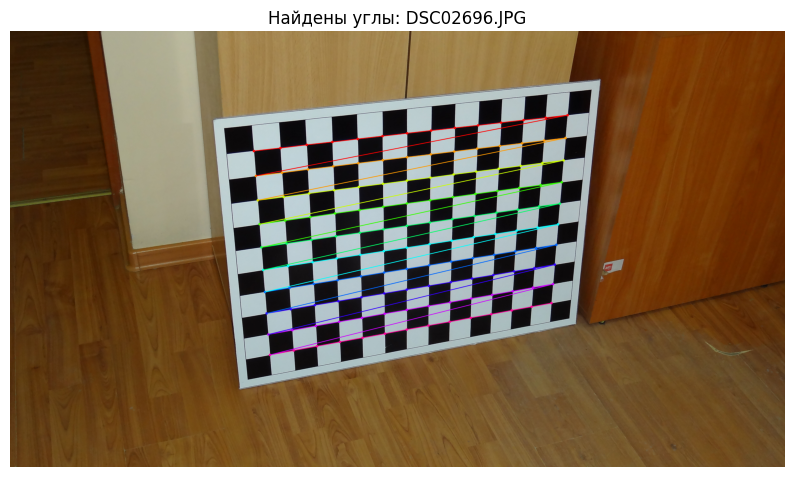

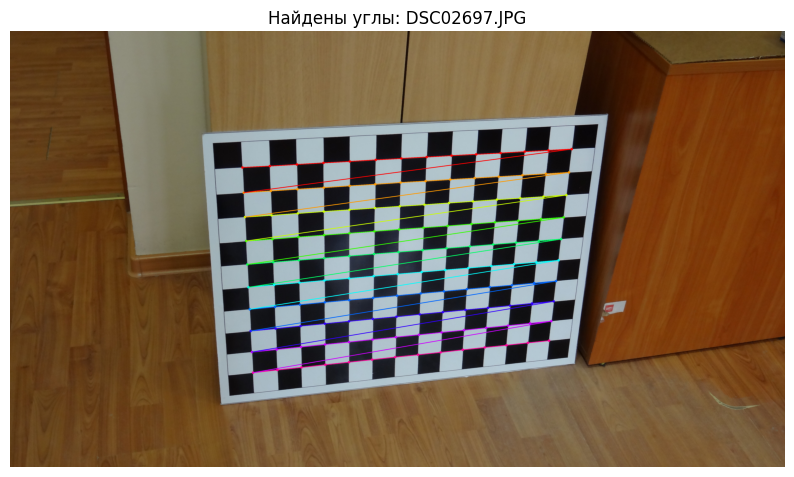

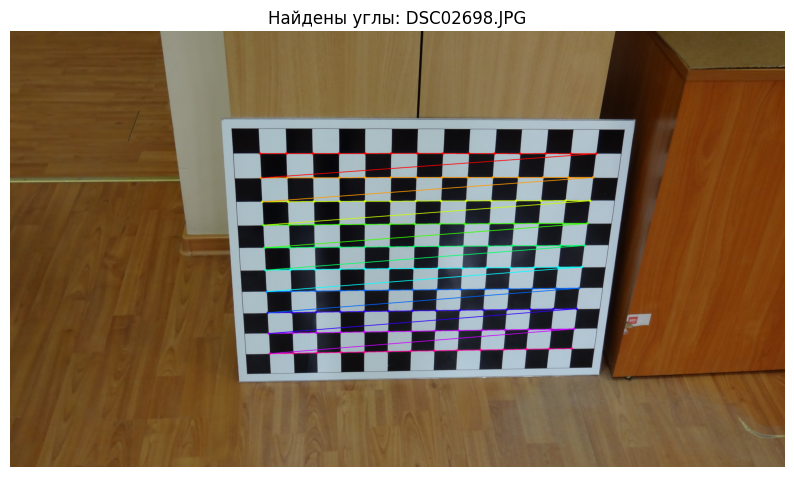

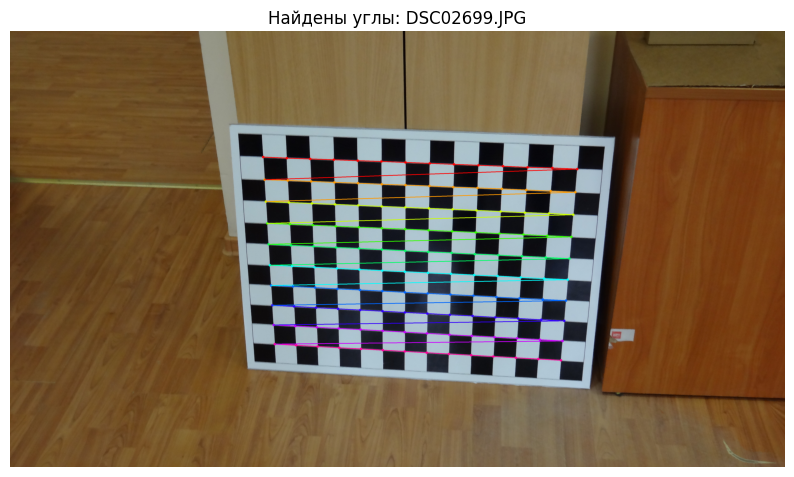

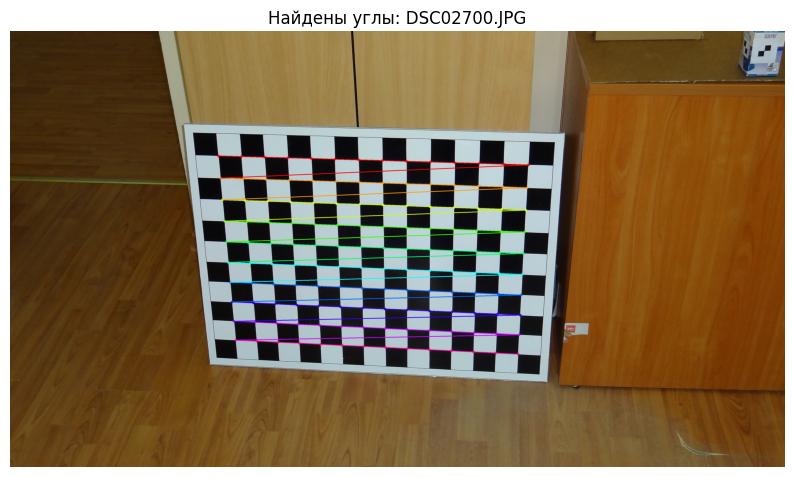

...

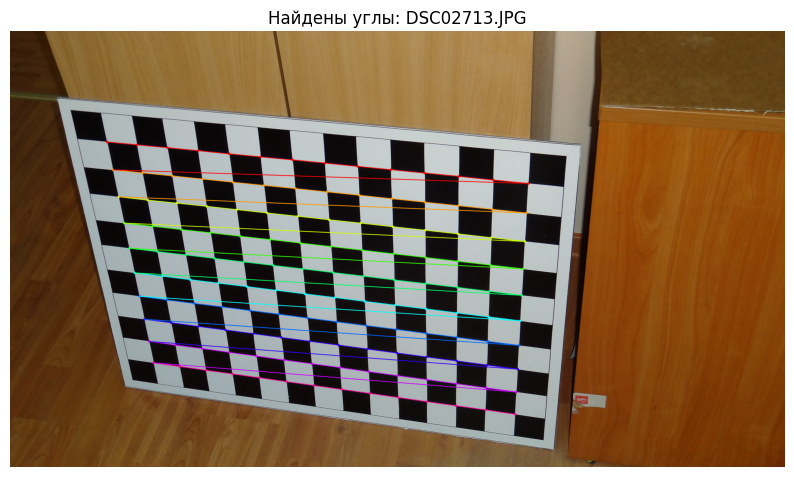

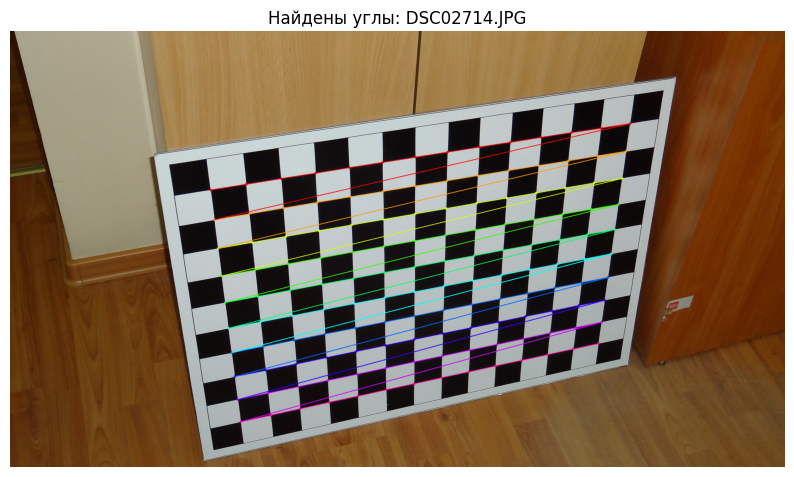

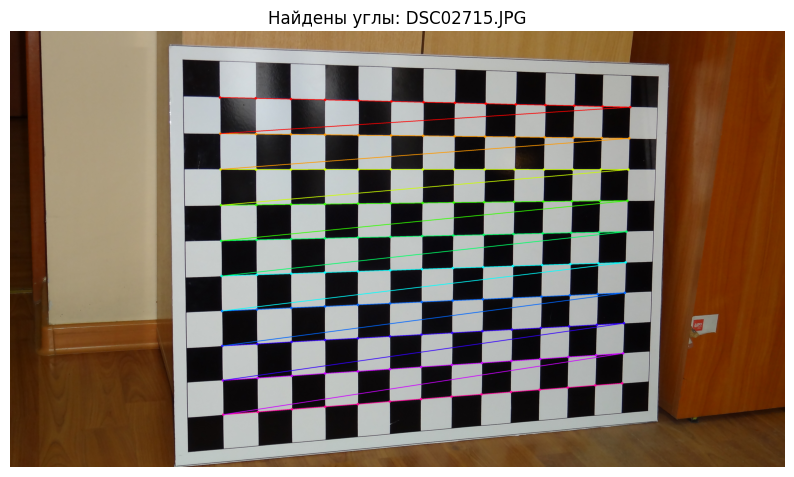

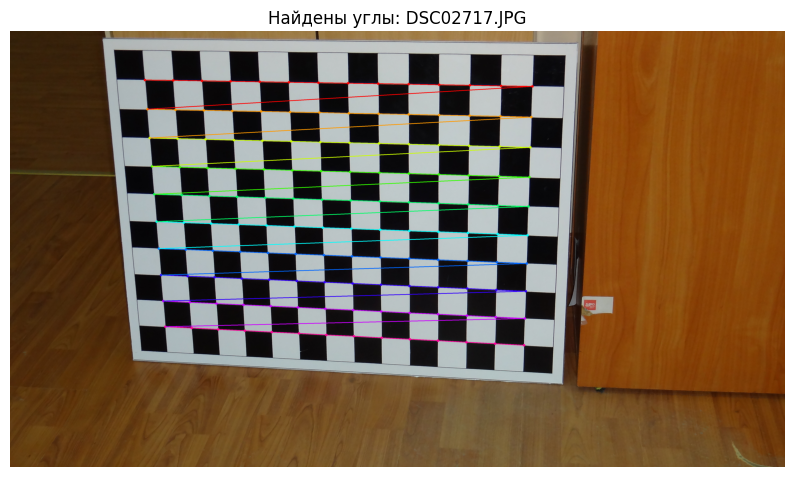

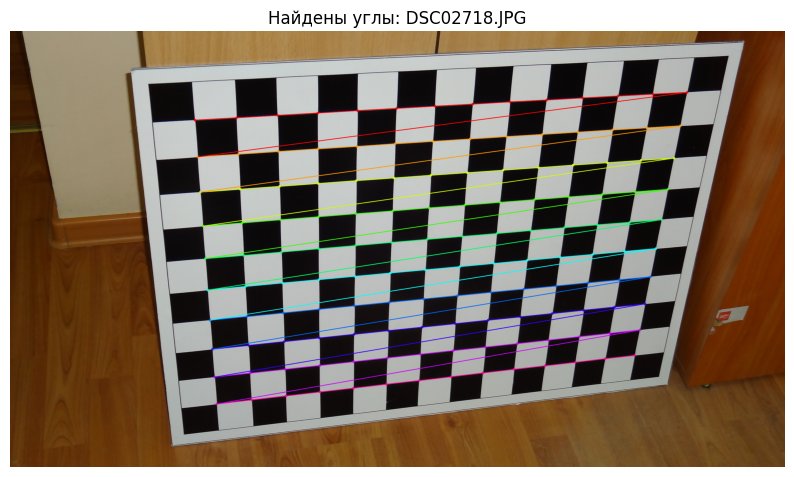

In [ ]:
# Критерии остановки для субпиксельного уточнения
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objpoints = []  # 3D точки в реальном мире
imgpoints = []  # 2D точки на изображении
good_images = []

for fname in image_paths:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Поиск углов
    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)
    if ret:
        objpoints.append(objp)
        # Субпиксельное уточнение
        corners_sub = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners_sub)
        good_images.append(fname)

        # Визуализация с жирными линиями
        img_with_corners = draw_chessboard_snake(img, corners, chessboard_size, thickness=4, point_radius=8)
        plt.figure(figsize=(10,6))
        plt.imshow(cv2.cvtColor(img_with_corners, cv2.COLOR_BGR2RGB))
        plt.title(f"Найдены углы: {os.path.basename(fname)}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Углы не найдены на {fname}")

# Калибровка

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
    objpoints, imgpoints, gray.shape[::-1], None, None)

print("Матрица внутренних параметров (K):\n", mtx)
print("\nКоэффициенты дисторсии:\n", dist.ravel())

Матрица внутренних параметров (K):
 [[6.05304386e+03 0.00000000e+00 2.54106629e+03]
 [0.00000000e+00 6.03790770e+03 1.30293216e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Коэффициенты дисторсии:
 [-1.75617506e-01  3.62500930e+00  3.27014252e-03  3.28190351e-03
 -2.11790275e+01]


In [ ]:
for i, (rvec, tvec) in enumerate(zip(rvecs, tvecs)):
    print(f"\nИзображение {i+1}:")
    print(f"\tВектор поворота: {rvec.ravel()}")
    print(f"\tВектор переноса: {tvec.ravel()}")


Изображение 1:
	Вектор поворота: [ 0.45590314 -0.33471187 -0.07278109]
	Вектор переноса: [-5.86132573 -3.2064893  35.54370585]

Изображение 2:
	Вектор поворота: [ 0.45060017 -0.2504773  -0.0211829 ]
	Вектор переноса: [-6.23182686 -2.56579191 35.19734909]

Изображение 3:
	Вектор поворота: [ 0.45231412 -0.08096209  0.01110823]
	Вектор переноса: [-5.78440398 -3.18894739 36.3868713 ]

Изображение 4:
	Вектор поворота: [0.40956276 0.09488636 0.02728659]
	Вектор переноса: [-6.24668353 -3.37393137 40.07647852]

Изображение 5:
	Вектор поворота: [0.42292284 0.09803041 0.01790061]
	Вектор переноса: [-8.20364181 -3.45929378 40.39845769]

Изображение 6:
	Вектор поворота: [0.41234971 0.22872319 0.07403409]
	Вектор переноса: [-7.20506247 -3.92384492 41.06436957]

Изображение 7:
	Вектор поворота: [0.38685734 0.23959846 0.06260513]
	Вектор переноса: [-8.04161275 -3.12570426 41.79096527]

Изображение 8:
	Вектор поворота: [0.38663205 0.33821259 0.10402405]
	Вектор переноса: [-7.42250524 -4.17015792 43.5

# Оценка точности (ошибка репроекции)

In [ ]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
    mean_error += error
mean_error /= len(objpoints)
print(f"Средняя ошибка репроекции: {mean_error:.4f} пикселей")

Средняя ошибка репроекции: 0.1551 пикселей


# Сохранение результатов


In [ ]:
np.savez('calibration_data.npz', mtx=mtx, dist=dist, rvecs=rvecs, tvecs=tvecs, error=mean_error)
print("Результаты сохранены в 'calibration_data.npz'")

Результаты сохранены в 'calibration_data.npz'
